# SHIP CLUSTERING WITH K-MEANS

## Library Importing

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans

## Data Loading

In [2]:
''' Load Dataset '''
data = pd.read_csv("ship-dataset.csv")

''' Show 5 baris teratas data '''
data.head(5)

,Date,Ship_Type,Route_Type,Engine_Type,Maintenance_Status,Speed_Over_Ground_knots,Engine_Power_kW,Distance_Traveled_nm,Draft_meters,Weather_Condition,Cargo_Weight_tons,Operational_Cost_USD,Revenue_per_Voyage_USD,Turnaround_Time_hours,Efficiency_nm_per_kWh,Seasonal_Impact_Score,Weekly_Voyage_Count,Average_Load_Percentage
0,2023-06-04,Container Ship,NaN,Heavy Fuel Oil (HFO),Critical,12.597558,2062.983982,1030.943616,14.132284,Moderate,1959.017882,483832.354540,292183.273104,25.867077,1.455179,1.415653,1,93.769249
1,2023-06-11,Fish Carrier,Short-haul,Steam Turbine,Good,10.387580,1796.057415,1060.486382,14.653083,Rough,162.394712,483388.000509,883765.787360,63.248196,0.290361,0.885648,6,93.895372
2,2023-06-18,Container Ship,Long-haul,Diesel,Fair,20.749747,1648.556685,658.874144,7.199261,Moderate,178.040917,448543.404044,394018.746904,49.418150,0.499595,1.405813,9,96.218244
3,2023-06-25,Bulk Carrier,Transoceanic,Steam Turbine,Fair,21.055102,915.261795,1126.822519,11.789063,Moderate,1737.385346,261349.605449,87551.375175,22.409110,0.702906,1.370704,1,66.193698
4,2023-07-02,Fish Carrier,Transoceanic,Diesel,Fair,13.742777,1089.721803,1445.281159,9.727833,Moderate,260.595103,287718.375160,676121.459632,64.158231,1.331343,0.583383,8,80.008581


## Data Cleaning

- Handling missing values (nilai hilang)
- Handling outliers

In [3]:
''' Melihat informasi dataset '''
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2736 entries, 0 to 2735
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Date                     2736 non-null   object 
 1   Ship_Type                2600 non-null   object 
 2   Route_Type               2600 non-null   object 
 3   Engine_Type              2600 non-null   object 
 4   Maintenance_Status       2600 non-null   object 
 5   Speed_Over_Ground_knots  2736 non-null   float64
 6   Engine_Power_kW          2736 non-null   float64
 7   Distance_Traveled_nm     2736 non-null   float64
 8   Draft_meters             2736 non-null   float64
 9   Weather_Condition        2600 non-null   object 
 10  Cargo_Weight_tons        2736 non-null   float64
 11  Operational_Cost_USD     2736 non-null   float64
 12  Revenue_per_Voyage_USD   2736 non-null   float64
 13  Turnaround_Time_hours    2736 non-null   float64
 14  Efficiency_nm_per_kWh   

**Keterangan:** <br>
- Data terdiri dari 2736 baris
- Terdiri dari 18 variabel independent
- Tipe data = numerik(12) dan objek(6)

In [4]:
''' Periksa Missing Values Data Numerik '''
num_features = data.select_dtypes(include='number')
missing_values = num_features.isnull().sum()
print(f"Missing values: {missing_values}")

Missing values: Speed_Over_Ground_knots    0
Engine_Power_kW            0
Distance_Traveled_nm       0
Draft_meters               0
Cargo_Weight_tons          0
Operational_Cost_USD       0
Revenue_per_Voyage_USD     0
Turnaround_Time_hours      0
Efficiency_nm_per_kWh      0
Seasonal_Impact_Score      0
Weekly_Voyage_Count        0
Average_Load_Percentage    0
dtype: int64


**Keterangan :** <br>
Tidak ada data numerik yang memiliki missing value

In [5]:
''' Periksa Missing Values Data Kategorik '''
cat_features = data.select_dtypes(include='object')
missing_values_cat = cat_features.isnull().sum()
print(f"Missing values: {missing_values_cat}")

Missing values: Date                    0
Ship_Type             136
Route_Type            136
Engine_Type           136
Maintenance_Status    136
Weather_Condition     136
dtype: int64


**Keterangan :** <br>
5 feature kategorik memiliki missing values yang semua sama-sama berjumlah 136 baris. <br>
Kita akan tangani dengan mengisi data hilang tersebut dengan data yang sering muncul (modus).

In [6]:
''' Handling Missing Values '''

#Cek Modus tiap feature
mode_values = data[['Ship_Type', 'Route_Type', 'Engine_Type', 'Maintenance_Status', 'Weather_Condition']].mode()
print(mode_values)

      Ship_Type Route_Type Engine_Type Maintenance_Status Weather_Condition
0  Bulk Carrier  Long-haul      Diesel               Good              Calm


In [7]:
''' Isi dengan nilai modus '''

from sklearn.impute import SimpleImputer # Library untuk mempermudah input data pada multiple kolom

imputer = SimpleImputer(strategy='most_frequent')
data[['Ship_Type', 'Route_Type', 'Engine_Type', 'Maintenance_Status', 'Weather_Condition']] = imputer.fit_transform(data[['Ship_Type', 'Route_Type', 'Engine_Type', 'Maintenance_Status', 'Weather_Condition']])

In [8]:
''' Cek Ulang Missing Values pada Objek Feature '''
cat_features = data.select_dtypes(include='object')
missing_values_cat = cat_features.isnull().sum()
print(f"Missing values: {missing_values_cat}")

Missing values: Date                  0
Ship_Type             0
Route_Type            0
Engine_Type           0
Maintenance_Status    0
Weather_Condition     0
dtype: int64


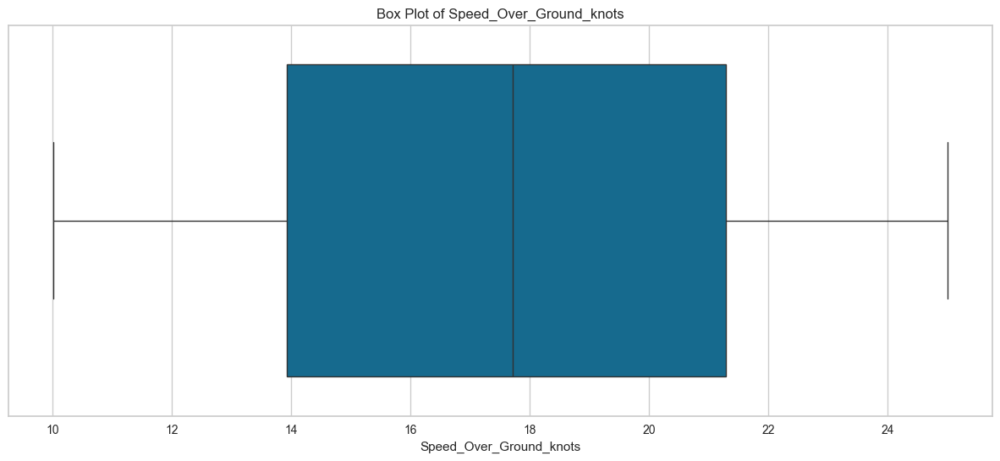

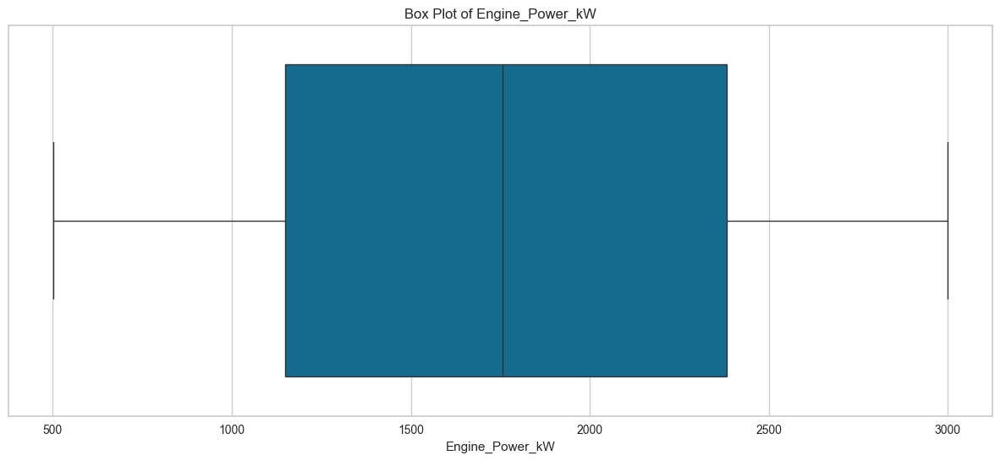

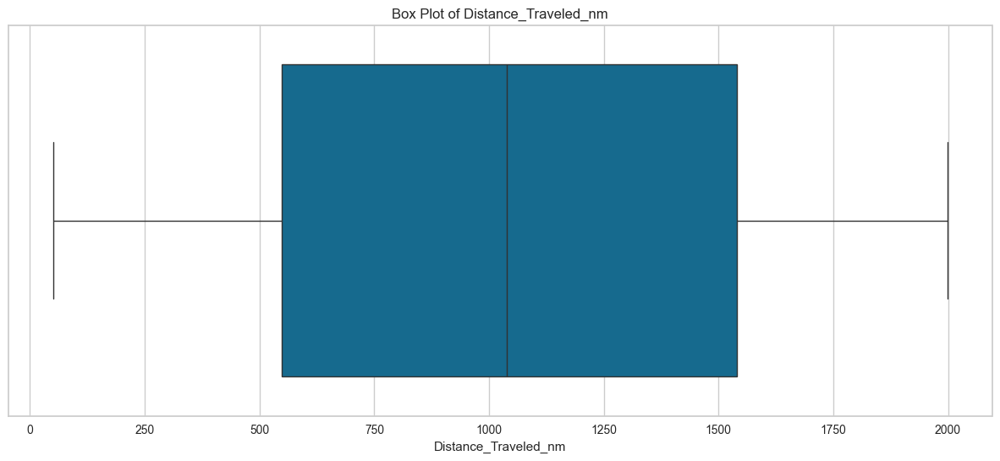

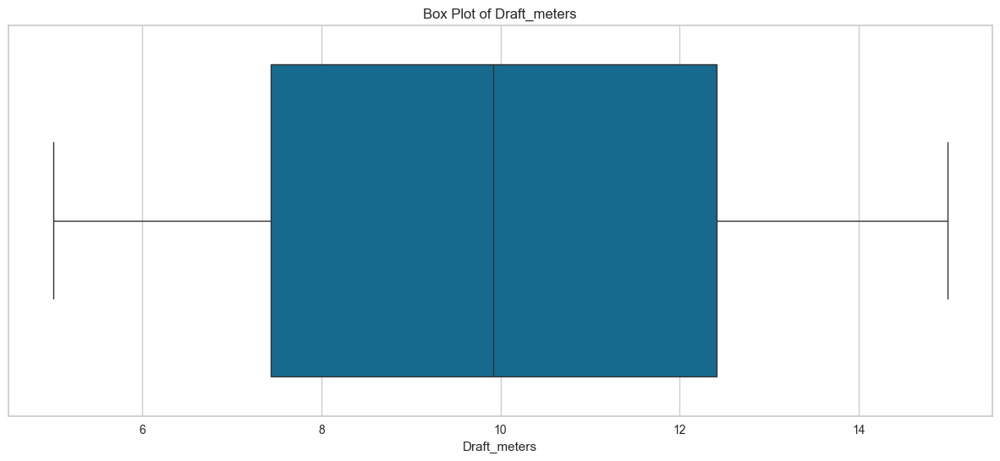

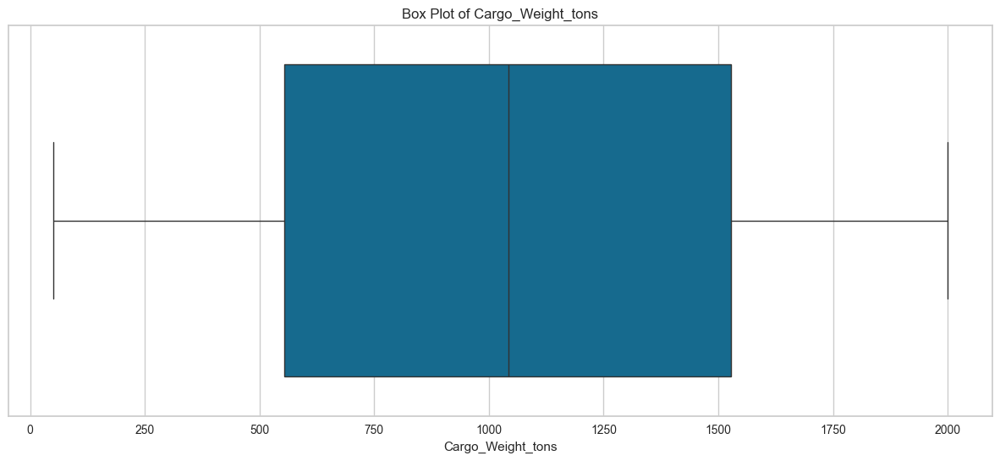

...

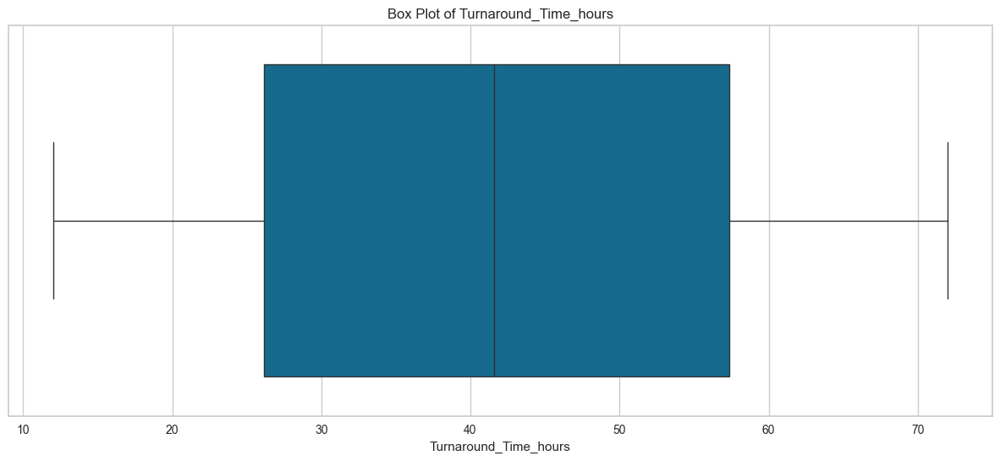

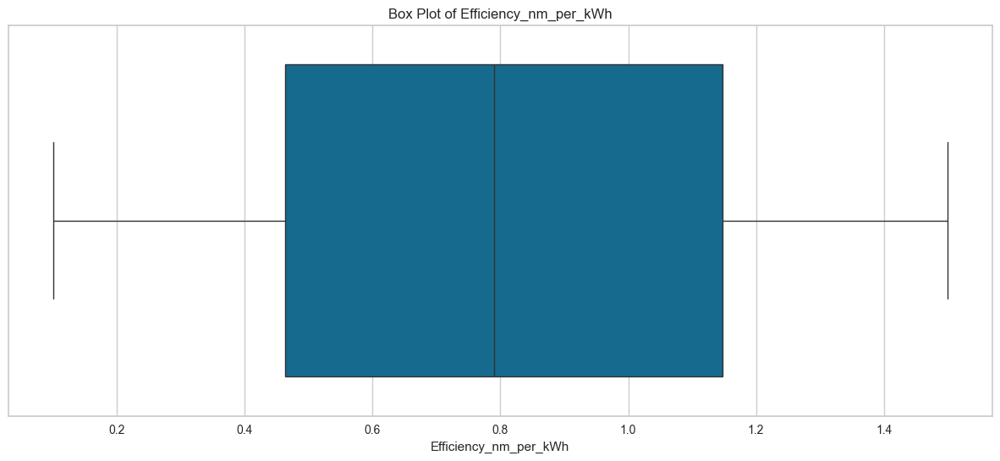

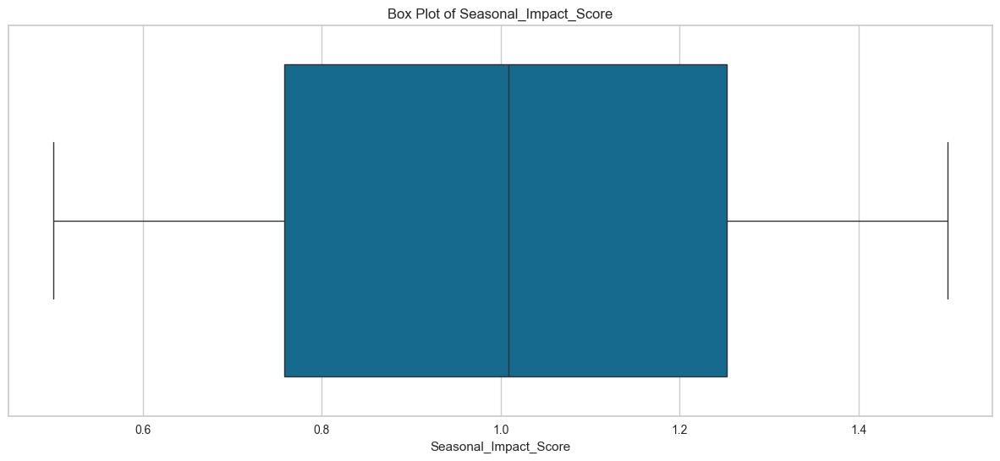

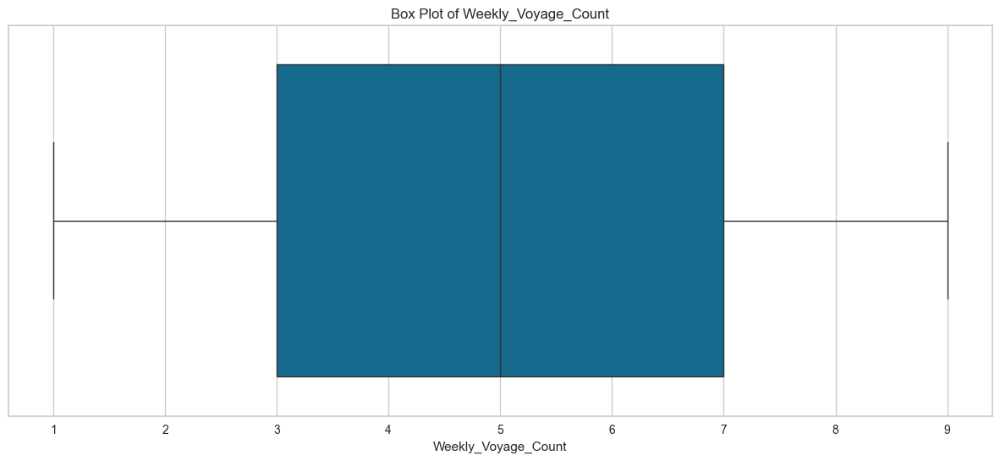

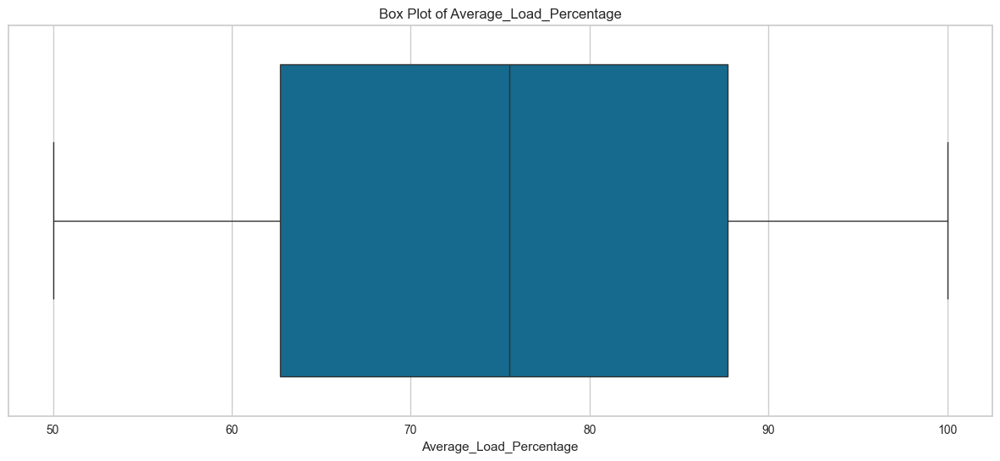

In [9]:
''' Outliers Handling '''

# Cek outliers dengan Boxplot
for feature in num_features.columns:
    plt.figure(figsize = (15, 6))
    sns.boxplot(x=num_features[feature])
    plt.title(f"Box Plot of {feature}")
    plt.show()

**Keterangan :** <br>
Semua fitur numerik bersih dari outlier

## Exploratory Data Analysis (EDA)

- Cek statistik deskriptif data
- Cek korelasi antar feature
- Label Encoding Data Kategorik

In [11]:
''' Cek statistik deskriptif dataset '''
data.describe()

,Speed_Over_Ground_knots,Engine_Power_kW,Distance_Traveled_nm,Draft_meters,Cargo_Weight_tons,Operational_Cost_USD,Revenue_per_Voyage_USD,Turnaround_Time_hours,Efficiency_nm_per_kWh,Seasonal_Impact_Score,Weekly_Voyage_Count,Average_Load_Percentage
count,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000
mean,17.602863,1757.610939,1036.406203,9.929103,1032.573264,255143.344488,521362.062011,41.747536,0.798656,1.003816,4.914839,75.219222
std,4.311979,717.002777,568.632080,2.876423,558.697499,140890.482189,271211.625499,17.633130,0.403590,0.288251,2.597647,14.510168
min,10.009756,501.025220,50.433150,5.001947,50.229624,10092.306318,50351.814447,12.019909,0.100211,0.500004,1.000000,50.012005
25%,13.928452,1148.104914,548.511573,7.437485,553.983629,131293.378767,290346.388017,26.173537,0.463592,0.758033,3.000000,62.703724
50%,17.713757,1757.494344,1037.816060,9.918965,1043.207497,257157.653226,520176.931762,41.585188,0.789877,1.009009,5.000000,75.504709
75%,21.284785,2382.594292,1540.934161,12.413149,1527.722391,381796.930499,750072.791216,57.363922,1.147426,1.252808,7.000000,87.721205
max,24.997043,2998.734329,1998.337057,14.992947,1999.126697,499734.867868,999916.696140,71.972415,1.499259,1.499224,9.000000,99.999643


**Keterangan :** <br>

Pada tabel di atas, kita bisa melihat jumlah baris, rata-rata nilai tiap fitur, standar deviasi, nilai min dan max, hingga kuartile per fitur. Informasi tersebut akan kita gunakan untuk melakukan eksplorasi data lebih lanjut seperti menemukan sebaran, pola, korelasi, dll. <br> <br>

Beberapa hal yang bisa dilihat adalah: <br>
1. Standar deviasi jauh dari 1, sehingga butuh standarisasi dengan scaling karena akan menggunakan model berbasis jarak (K-Means)
2. Skala antar data ada pada range yang berbeda-beda. Misalnya Operation_Cost (puluhan hingga ratusan ribu), sementara Turnaround_Time di bawah 100. GAP ini butuh distandarisasi agar berskala seimbang

In [12]:
data.shape[1]

18

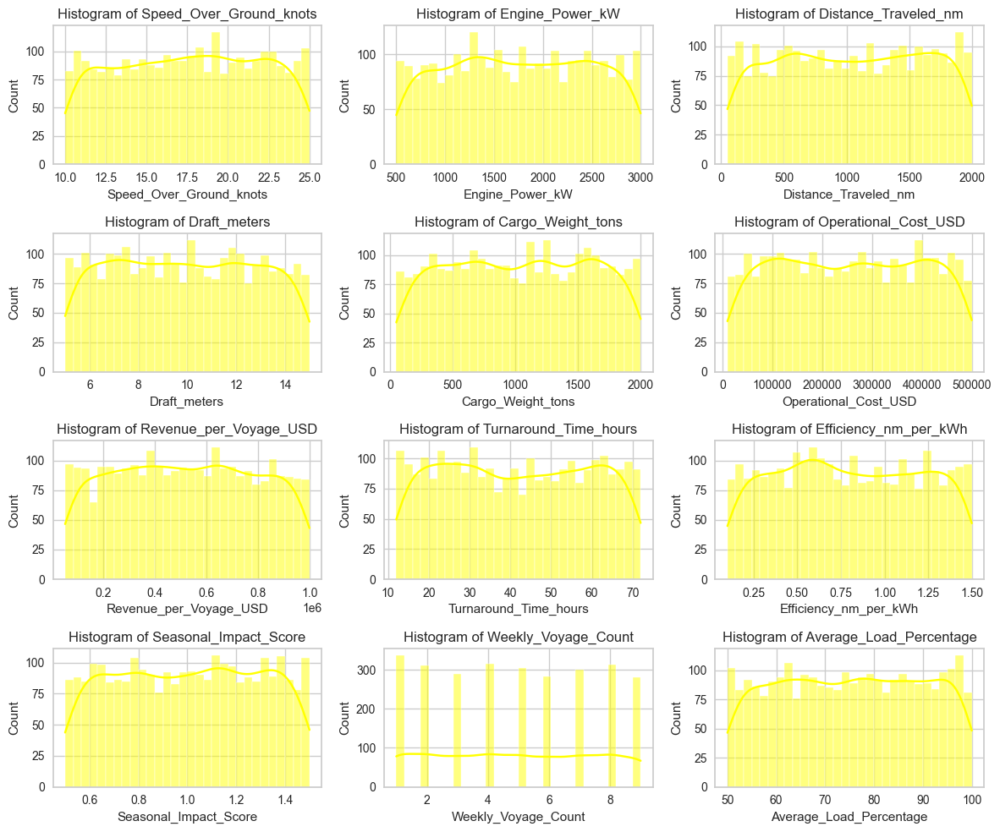

In [13]:
''' Visualisasi Histogram untuk Lihat Sebaran Data '''

# Tentukan jumlah baris dan kolom
num_vars = data.shape[1]
n_cols = 12

# Distribusi fitur numerik
num_features = data.select_dtypes(include='number').columns
plt.figure(figsize=(12,10))
for i, col in enumerate(num_features, 1):
    plt.subplot(4, 3, i)
    sns.histplot(data[col], bins=30, kde=True, color='yellow')
    plt.title(f"Histogram of {col}")
plt.tight_layout()
plt.show()

Dengan histogram di atas kita bisa melihat seberapa luas persebaran data pada setiap feature. Perbedaan sebaran antar fitur dapat membuat model bermasalah saat melakukan building. Kita akan cek skewness untuk mengetahui kecenderungan sebaran data.

In [14]:
numeric_features = data.select_dtypes(include=['int64', 'float64']).columns

for feature in numeric_features:
    skewness = data[feature].skew()
    print(f"skewness {feature}: {skewness}")

skewness Speed_Over_Ground_knots: -0.03493526352239457
skewness Engine_Power_kW: -0.005610803546649069
skewness Distance_Traveled_nm: -0.021635608498918744
skewness Draft_meters: 0.02133317574399249
skewness Cargo_Weight_tons: -0.013293242255539442
skewness Operational_Cost_USD: 0.0019972410314236474
skewness Revenue_per_Voyage_USD: 0.011941106311050853
skewness Turnaround_Time_hours: 0.017989715515068606
skewness Efficiency_nm_per_kWh: 0.025919042947843696
skewness Seasonal_Impact_Score: -0.018755729859744545
skewness Weekly_Voyage_Count: 0.024583237999959914
skewness Average_Load_Percentage: -0.01783990191333669


**Keterangan :**

- Nilai negatif (left skew): menunjukkan rata-rata sebaran data ada di nilai rendah
- Nilai positif (right skew): menunjukkan rata-rata sebaran data ada di nilai tinggi

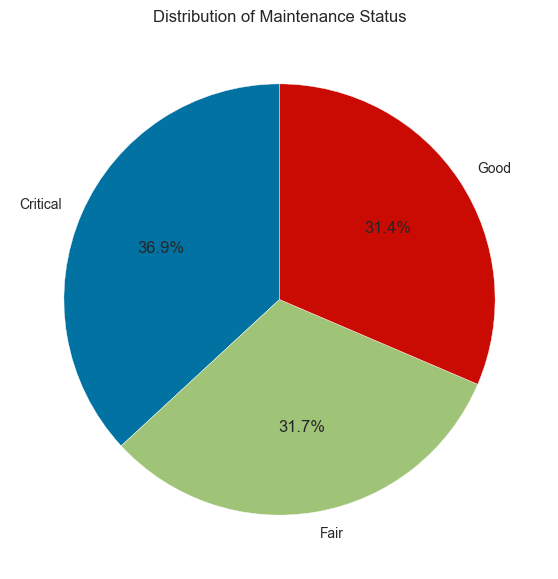

In [14]:
''' CEK SEBARAN DATA FITUR KATEGORIK (Maintenance_Status) '''
plt.figure(figsize=(7,7))
plt.pie(data['Maintenance_Status'].value_counts(), labels=['Critical', 'Fair', 'Good'], autopct='%1.1f%%', startangle=90)
plt.title("Distribution of Maintenance Status")
plt.show()

**KETERANGAN :**

Presentase terbesar adalah Status Critical. Ini menunjukkan adanya banyak kapal yang memiliki status keadaan buruk. Status ini sangat berkorelasi dengan tingginya operasional cost yang dikeluarkan untuk kapal-kapal tersebut.<br>

**Dapat ditarik informasi bahwa kapal yang memiliki maintenance_status buruk dapat meningkatkan biaya operasional**

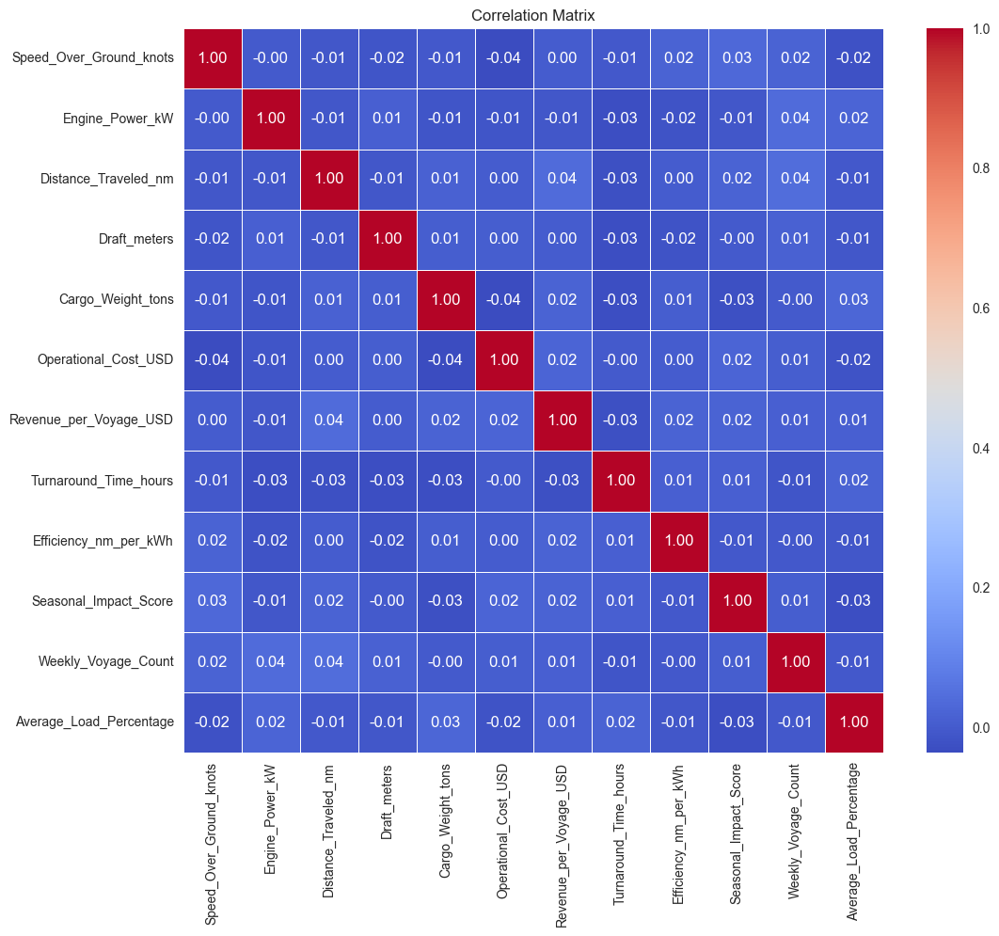

In [15]:
''' Cek Korelasi Antar Fitur dengan Heatmap '''
num_feature = data.select_dtypes(include='number').columns

plt.figure(figsize=(12, 10))
correlation_matrix = data[num_features].corr()
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)
plt.title("Correlation Matrix")
plt.show()

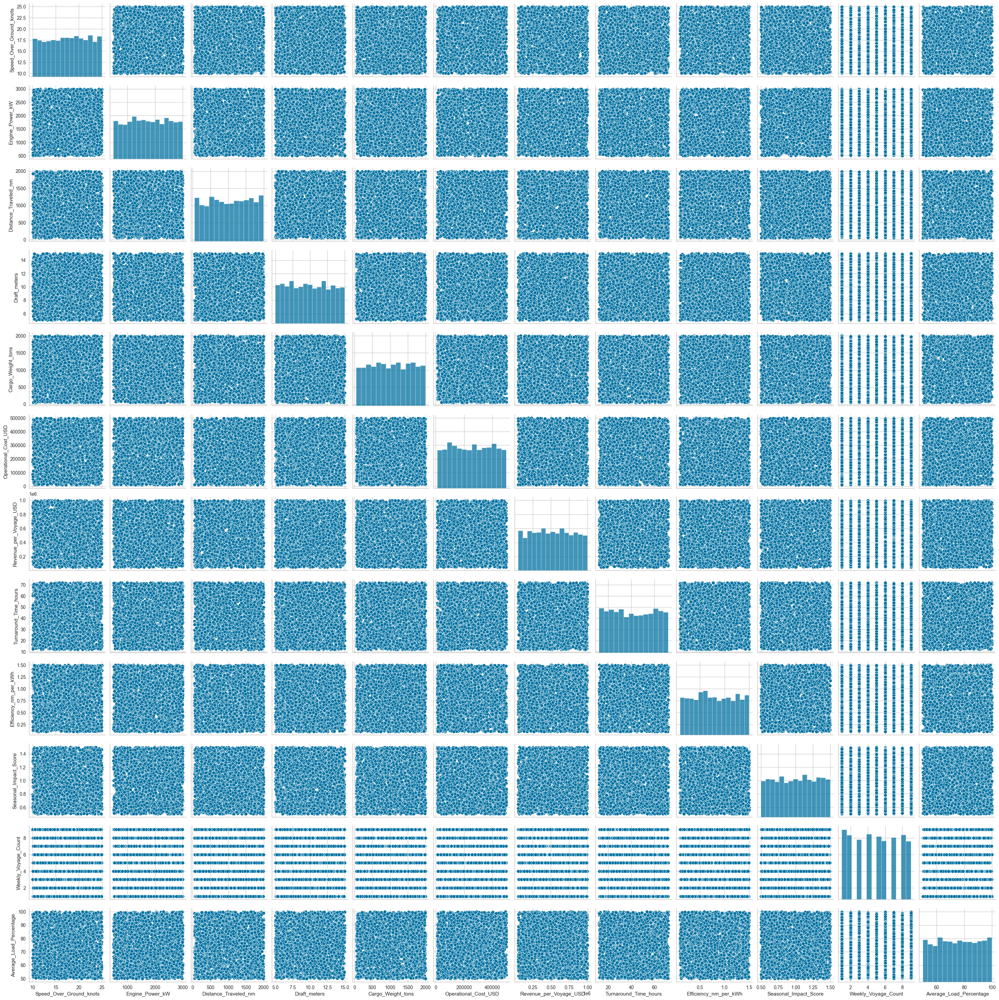

In [17]:
sns.pairplot(data[num_features])
plt.show()

**Keterangan :**

Tampaknya tidak ada korelasi yang sangat kuat antarfitur. Hal ini bisa menjadi pertanda bagus karena data kita terhindar dari multikolinearitas. Namun, kekurangannya adalah kita akan sedikit kesulitan dalam menentukan fitur mana saja yang akan digunakan dalam pembangunan model clustering. Oleh karena itu, pengembang diharapkan bisa mengeksplorasi data dengan model lebih jauh.

In [20]:
''' Label Encoding untuk Fitur Kategorik'''
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

cat_encod = data[['Ship_Type', 'Route_Type', 'Engine_Type', 'Maintenance_Status', 'Weather_Condition']]
for col in cat_encod:
    data[col] = encoder.fit_transform(data[col])

In [21]:
data.head()

,Date,Ship_Type,Route_Type,Engine_Type,Maintenance_Status,Speed_Over_Ground_knots,Engine_Power_kW,Distance_Traveled_nm,Draft_meters,Weather_Condition,Cargo_Weight_tons,Operational_Cost_USD,Revenue_per_Voyage_USD,Turnaround_Time_hours,Efficiency_nm_per_kWh,Seasonal_Impact_Score,Weekly_Voyage_Count,Average_Load_Percentage
0,2023-06-04,1,1,1,0,12.597558,2062.983982,1030.943616,14.132284,1,1959.017882,483832.354540,292183.273104,25.867077,1.455179,1.415653,1,93.769249
1,2023-06-11,2,2,2,2,10.387580,1796.057415,1060.486382,14.653083,2,162.394712,483388.000509,883765.787360,63.248196,0.290361,0.885648,6,93.895372
2,2023-06-18,1,1,0,1,20.749747,1648.556685,658.874144,7.199261,1,178.040917,448543.404044,394018.746904,49.418150,0.499595,1.405813,9,96.218244
3,2023-06-25,0,3,2,1,21.055102,915.261795,1126.822519,11.789063,1,1737.385346,261349.605449,87551.375175,22.409110,0.702906,1.370704,1,66.193698
4,2023-07-02,2,3,0,1,13.742777,1089.721803,1445.281159,9.727833,1,260.595103,287718.375160,676121.459632,64.158231,1.331343,0.583383,8,80.008581


## Data Splitting

Dalam kesempatan ini, Kita akan menggunakan 3 feature: <br>
1. Maintenance Status
2. Turnaround Time Hours
3. Operational Cost (USD)
<br>

Kenapa? Karena 3 feature ini memiliki pengaruh kuat terhadap biaya operasional. <br>
- Semakin buruk status keadaan kapal, biaya operasional makin tinggi
- Semakin lama kapal berlabuh (turnaround) di dermaga, semakin sedikit penghasilan dari kapal. Biaya transit juga meningkat.

In [22]:
''' Ambil Kolom Feature yang Dibutuhkan '''
X = data[['Maintenance_Status', 'Operational_Cost_USD', 'Turnaround_Time_hours']]

In [23]:
''' Cadangkan Data X '''
X_original = X.copy()

In [24]:
X_original.head()

,Maintenance_Status,Operational_Cost_USD,Turnaround_Time_hours
0,0,483832.354540,25.867077
1,2,483388.000509,63.248196
2,1,448543.404044,49.418150
3,1,261349.605449,22.409110
4,1,287718.375160,64.158231


**Keterangan Maintenance Status :**

- 0 = Critical
- 1 = Fair
- 2 = Good

In [25]:
''' Scaling untuk K-Means '''
scaler = StandardScaler()
num_cols = ['Operational_Cost_USD', 'Turnaround_Time_hours']

# Scaling hanya kolom numerik
X_scaled_num = scaler.fit_transform(X[num_cols])
X_scaled_num = pd.DataFrame(X_scaled_num, columns=num_cols, index=X.index)

# Gabungkan kembali
X_scaled = pd.concat([X[['Maintenance_Status']], X_scaled_num], axis=1)

# Urutkan kolom sesuai urutan asli
X_scaled = X_scaled[X.columns]

X_scaled.head()

,Maintenance_Status,Operational_Cost_USD,Turnaround_Time_hours
0,0,1.623465,-0.900768
1,2,1.620311,1.219556
2,1,1.372949,0.435091
3,1,0.044058,-1.096910
4,1,0.231250,1.271175


## KElbow Method

Method ini digunakan untuk menentukan nilai K yang terbaik untuk model K-Means yang akan kita gunakan

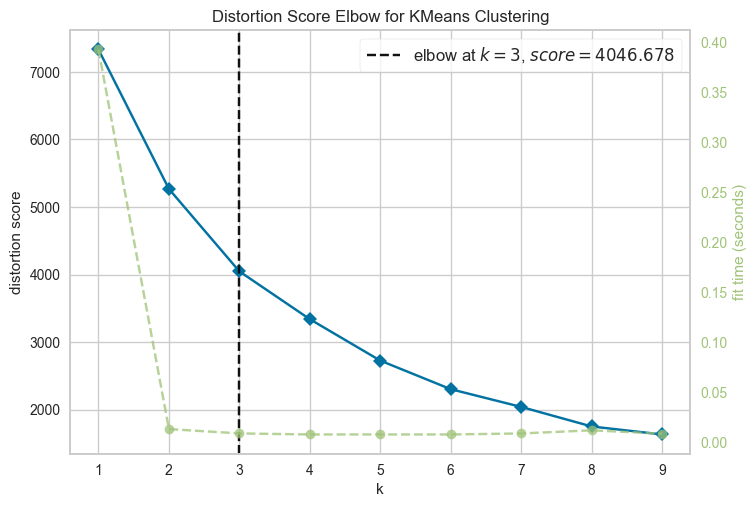

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [26]:
''' Dengan Standarisasi '''
# Inisialisasi KMeans
kmeans = KMeans()

# Visualisasikan KElbow
visualizer = KElbowVisualizer(kmeans, k=(1,10)) # Rentang K 1-10
visualizer.fit(X_scaled)
visualizer.show()

**Keterangan :**

Dari Visualisasi KElbow, nilai terbaik untuk jumlah kluster adalah 4. Ini diperhitungkan berdasarkan grafik performa model yang mulai menurun signifikan setelah jumlah klaster menyentuh 4

## K-Means Modelling

In [36]:
''' Dengan Standarisasi '''
kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(X_scaled)

# AGAR SETIAP CLUSTER PUNYA LABEL
labels = kmeans.labels_

k = 3

# FUNGSI UNTUL ANALISIS KARAKTERISTIK CLSUTER
def analyze_clusters(X_scaled, labels, k):
    print("Analisis Karakteristik Setiap Cluster (Data Scaling):")
    for cluster_id in range(k):
        # Mengambil data untuk cluster saat ini
        cluster_data = X_scaled[labels == cluster_id] # jadikan numpy array

        # Menghitung rata-rata untuk setiap fitur numerik
        mean_operational_cost = cluster_data['Operational_Cost_USD'].mean()
        mean_turnaround = cluster_data['Turnaround_Time_hours'].mean()

        # Kategorik proporsi
        cat_counts = cluster_data['Maintenance_Status'].value_counts(normalize=True)*100

        print(f"\nCluster {cluster_id + 1}:")
        print(f"Mean Turnaround Time (hour) : {mean_turnaround:.2f}")
        print(f"Mean Operational Cost (USD) : {mean_operational_cost:.2f}")
        print("Proporsi Maintenance Status: ")
        for status, prop in cat_counts.items():
            print(f" - {status} : {prop:.1f}%")

# ANALISIS KARAKTERISTIK SETIAP CLUSTER
analyze_clusters(X_scaled, labels, k)

Analisis Karakteristik Setiap Cluster (Data Scaling):

Cluster 1:
Mean Turnaround Time (hour) : -0.63
Mean Operational Cost (USD) : -0.94
Proporsi Maintenance Status: 
 - 2 : 34.6%
 - 0 : 33.1%
 - 1 : 32.3%

Cluster 2:
Mean Turnaround Time (hour) : 1.05
Mean Operational Cost (USD) : 0.02
Proporsi Maintenance Status: 
 - 2 : 37.0%
 - 0 : 31.9%
 - 1 : 31.1%

Cluster 3:
Mean Turnaround Time (hour) : -0.69
Mean Operational Cost (USD) : 0.93
Proporsi Maintenance Status: 
 - 2 : 39.1%
 - 1 : 31.8%
 - 0 : 29.1%


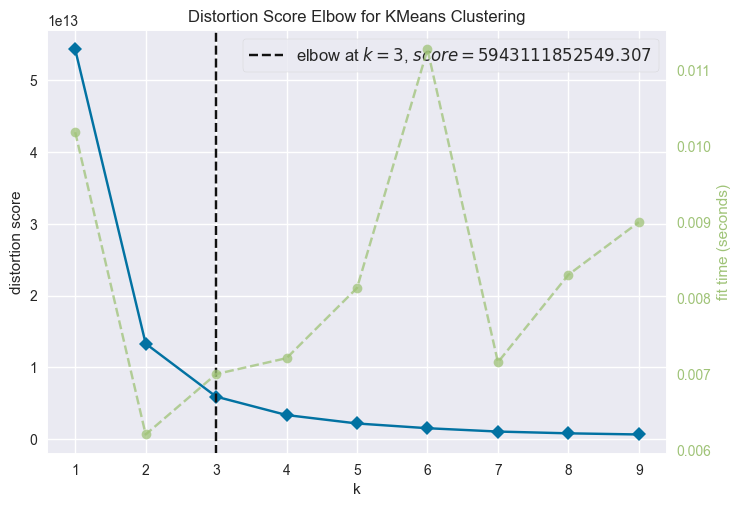

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [34]:
''' Tanpa Standarisasi '''
# Inisialisasi KMeans
kmeans = KMeans()

# Visualisasikan KElbow
visualizer = KElbowVisualizer(kmeans, k=(1,10)) # Rentang K 1-10
visualizer.fit(X_original)
visualizer.show()

In [64]:
''' Tanpa Standarisasi '''
kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(X_original)

# AGAR SETIAP CLUSTER PUNYA LABEL
labels = kmeans.labels_

k = 3

# FUNGSI UNTUL ANALISIS KARAKTERISTIK CLSUTER
def analyze_clusters(X_original, labels, k):
    print("Analisis Karakteristik Setiap Cluster (Data Asli):")
    for cluster_id in range(k):
        # Mengambil data untuk cluster saat ini
        cluster_data = X_original[labels == cluster_id] # jadikan numpy array

        # Menghitung rata-rata untuk setiap fitur numerik
        mean_operational_cost = cluster_data['Operational_Cost_USD'].mean()
        mean_turnaround = cluster_data['Turnaround_Time_hours'].mean()

        # Kategorik proporsi
        cat_counts = cluster_data['Maintenance_Status'].value_counts(normalize=True)*100

        print(f"\nCluster {cluster_id + 1}:")
        print(f"Mean Turnaround Time (hour) : {mean_turnaround:.2f}")
        print(f"Mean Operational Cost (USD) : {mean_operational_cost:.2f}")
        print("Proporsi Maintenance Status: ")
        for status, prop in cat_counts.items():
            print(f" - {status} : {prop:.1f}%")

# ANALISIS KARAKTERISTIK SETIAP CLUSTER
analyze_clusters(X_original, labels, k)

Analisis Karakteristik Setiap Cluster (Data Asli):

Cluster 1:
Mean Turnaround Time (hour) : 41.50
Mean Operational Cost (USD) : 91197.77
Proporsi Maintenance Status: 
 - 2 : 36.2%
 - 1 : 32.3%
 - 0 : 31.4%

Cluster 2:
Mean Turnaround Time (hour) : 41.25
Mean Operational Cost (USD) : 415232.33
Proporsi Maintenance Status: 
 - 2 : 37.6%
 - 1 : 32.0%
 - 0 : 30.5%

Cluster 3:
Mean Turnaround Time (hour) : 42.52
Mean Operational Cost (USD) : 250417.50
Proporsi Maintenance Status: 
 - 2 : 36.8%
 - 0 : 32.4%
 - 1 : 30.8%


In [38]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Inisialisasi K-Means dengan k=6
kmeans_cluster = KMeans(n_clusters=3, random_state=0, n_init='auto')
labels = (kmeans_cluster.fit_predict(X_scaled))

# Simpan hasilnya ke variabel dengan nama yang berbeda
silhouette_score_hasil_1 = silhouette_score(X_scaled, labels)

# Cetak hasilnya
print(f"Silhouette score data scaled: {silhouette_score_hasil_1}")

Silhouette score data scaled: 0.2718502441380271


In [39]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Inisialisasi K-Means dengan k=5
kmeans_cluster = KMeans(n_clusters=3, random_state=0, n_init='auto')
labels = (kmeans_cluster.fit_predict(X_original))

# Simpan hasilnya ke variabel dengan nama yang berbeda
silhouette_score_hasil_2 = silhouette_score(X_original, labels)

# Cetak hasilnya
print(f"Silhouette score data asli: {silhouette_score_hasil_2}")

Silhouette score data asli: 0.5926111764928828


## Interpretasi

1. Ternyata setelah dilakukan building model dan testing evaluasi dengan silhouette score, model bekerja lebih baik pada data asli. Hal ini dibutktikan dengan nilai silhouette score yang mendekati 6
2. Terdapat 3 cluster yang didapatkan.
<br>

Analisis Karakteristik Setiap Cluster (Data Asli):<br>

Cluster 1 (Biaya Terendah) :<br>
Mean Turnaround Time (hour) : 41.50<br>
Mean Operational Cost (USD) : 91197.77<br>
Proporsi Maintenance Status: <br>
 - 2 : 36.2%<br>
 - 1 : 32.3%<br>
 - 0 : 31.4%<br>

Cluster 2 (Biaya Tertinggi) :<br>
Mean Turnaround Time (hour) : 41.25<br>
Mean Operational Cost (USD) : 415232.33<br>
Proporsi Maintenance Status: <br>
 - 2 : 37.6%<br>
 - 1 : 32.0%<br>
 - 0 : 30.5%<br>

Cluster 3 (Biaya Sedang) :<br>
Mean Turnaround Time (hour) : 42.52<br>
Mean Operational Cost (USD) : 250417.50<br>
Proporsi Maintenance Status: <br>
 - 2 : 36.8%<br>
 - 0 : 32.4%<br>
 - 1 : 30.8%<br>

## Gabungkan label hasil Cluster

In [ ]:
import numpy as np

unik = np.unique(labels)
print(unik)

[0 1 2]


In [71]:
X_original['Cluster'] = labels

In [73]:
X_original.head(20)

,Maintenance_Status,Operational_Cost_USD,Turnaround_Time_hours,Cluster
0,0,483832.354540,25.867077,1
1,2,483388.000509,63.248196,1
2,1,448543.404044,49.418150,1
3,1,261349.605449,22.409110,2
4,1,287718.375160,64.158231,2
5,1,184569.045384,47.476155,2
6,0,434449.263514,29.040420,1
7,0,348380.608232,52.478600,1
8,2,346071.519942,14.451820,1
9,1,149790.209291,63.742761,0
